# Exploratory Analysis

In [19]:
import pandas as pd
from pathlib import Path
import random
from PIL import Image
import matplotlib.pyplot as plt


pd.set_option("display.width", 200)


First, we inspect CSV schemas:

In [5]:
train_df = pd.read_csv("../data/train_metadata.csv")
val_df   = pd.read_csv("../data/val_metadata.csv")
sub_df   = pd.read_csv("../data/sample_submission.csv")

print("TRAIN columns:", list(train_df.columns))
print(train_df.head(3), "\n")

print("VAL columns:", list(val_df.columns))
print(val_df.head(3), "\n")

print("SUB columns:", list(sub_df.columns))
print(sub_df.head(3))

TRAIN columns: ['path', 'class', 'class_idx']
                                               path             class  class_idx
0  Brandt_Cormorant/Brandt_Cormorant_0071_23007.jpg  Brandt_Cormorant          4
1  Brandt_Cormorant/Brandt_Cormorant_0028_22892.jpg  Brandt_Cormorant          4
2  Brandt_Cormorant/Brandt_Cormorant_0076_23021.jpg  Brandt_Cormorant          4 

VAL columns: ['path', 'class', 'class_idx']
                                               path             class  class_idx
0  Brandt_Cormorant/Brandt_Cormorant_0092_23061.jpg  Brandt_Cormorant          4
1  Brandt_Cormorant/Brandt_Cormorant_0047_23337.jpg  Brandt_Cormorant          4
2  Brandt_Cormorant/Brandt_Cormorant_0083_23156.jpg  Brandt_Cormorant          4 

SUB columns: ['class_idx', 'path']
   class_idx                                      path
0         16  6ee33d4a-d301-4cb5-be75-8aadcd02f195.jpg
1         15  4eb59185-1ba8-464d-abbf-a26a614de983.jpg
2          8  9b3b5ec2-7e06-4b0d-80f2-0649b68be525.jpg


Next we check: missing files referenced by the CSV, duplicate file names, class counts and whether labels are already integers (0–19) or strings

In [7]:
DATA = Path("../data")

def guess_col(df, candidates):
    for c in candidates:
        if c in df.columns:
            return c
    return None

img_col = guess_col(train_df, ["path","filepath","file","filename","image","img","Image","image_path"])
lab_col = guess_col(train_df, ["label","class","category","target","class_idx","y"])

print("Guessed img_col:", img_col)
print("Guessed lab_col:", lab_col)

assert img_col is not None, "Couldn't guess image column. Print columns and pick it manually."
assert lab_col is not None, "Couldn't guess label column. Print columns and pick it manually."

def check_paths(df, folder):
    paths = (DATA/folder) / df[img_col].astype(str)
    exists = paths.apply(lambda p: Path(p).exists())
    return exists.mean(), df.loc[~exists, img_col].head(10)

train_ok, train_missing = check_paths(train_df, "train_images")
val_ok, val_missing     = check_paths(val_df,   "val_images")

print(f"Train path exists rate: {train_ok:.3f}")
print("Train missing examples:\n", train_missing, "\n")
print(f"Val path exists rate: {val_ok:.3f}")
print("Val missing examples:\n", val_missing, "\n")

# duplicates
print("Train duplicate image entries:", train_df[img_col].duplicated().sum())
print("Val duplicate image entries:", val_df[img_col].duplicated().sum())

# labels info
print("Unique train labels:", train_df[lab_col].nunique())
print("Label dtype:", train_df[lab_col].dtype)
print("Top label counts:\n", train_df[lab_col].value_counts().head(10))

Guessed img_col: path
Guessed lab_col: class
Train path exists rate: 1.000
Train missing examples:
 Series([], Name: path, dtype: object) 

Val path exists rate: 1.000
Val missing examples:
 Series([], Name: path, dtype: object) 

Train duplicate image entries: 0
Val duplicate image entries: 0
Unique train labels: 20
Label dtype: object
Top label counts:
 class
Bobolink                58
Groove_billed_Ani       58
Rusty_Blackbird         57
Indigo_Bunting          57
Yellow_billed_Cuckoo    55
Brewer_Blackbird        55
Black_billed_Cuckoo     55
Fish_Crow               54
Gray_Catbird            54
Lazuli_Bunting          54
Name: count, dtype: int64


Next, we check class balance + train/val consistency:

In [14]:
LAB_COL = "class_idx" 

train_counts = train_df[LAB_COL].value_counts().sort_index()
val_counts   = val_df[LAB_COL].value_counts().sort_index()

dist = pd.DataFrame({"train": train_counts, "val": val_counts}).fillna(0).astype(int)
dist["train_pct"] = (dist["train"] / dist["train"].sum()).round(4)
dist["val_pct"]   = (dist["val"]   / dist["val"].sum()).round(4)

print(dist)
print("\nTotal train:", dist["train"].sum(), "Total val:", dist["val"].sum())

           train  val  train_pct  val_pct
class_idx                                
0             58    2     0.0536   0.0194
1             53    7     0.0490   0.0680
2             57    3     0.0527   0.0291
3             54    5     0.0499   0.0485
4             53    6     0.0490   0.0583
5             54    6     0.0499   0.0583
6             57    3     0.0527   0.0291
7             55    4     0.0508   0.0388
8             52    6     0.0481   0.0583
9             58    2     0.0536   0.0194
10            54    4     0.0499   0.0388
11            54    2     0.0499   0.0194
12            53    7     0.0490   0.0680
13            54    6     0.0499   0.0583
14            52    7     0.0481   0.0680
15            55    4     0.0508   0.0388
16            51    8     0.0471   0.0777
17            55    5     0.0508   0.0485
18            51    8     0.0471   0.0777
19            52    8     0.0481   0.0777

Total train: 1082 Total val: 103


##### Insight
Train is near-perfectly balanced across 20 classes (~5% each), but the provided validation split is very small (103 images) and shows noticeable class proportion drift (e.g., some classes have only 2 images, others 8). As a result, validation accuracy will be high-variance and unreliable for model selection. This val split should be used mainly for quick sanity checks and we should rely on stratified K-fold CV on the train set for trustworthy comparisons and tuning

Next we evaluate image size distribution:

In [15]:
IMG_COL = "path"
paths = [DATA/"train_images"/p for p in train_df[IMG_COL].astype(str).tolist()]
paths = [p for p in paths if p.exists()]

random.seed(0)
sample = random.sample(paths, k=min(400, len(paths)))

sizes = []
for p in sample:
    with Image.open(p) as im:
        sizes.append(im.size)  # (W,H)

ws = [w for w,h in sizes]
hs = [h for w,h in sizes]

print("Sampled images:", len(sizes))
print("Width: min/med/max =", min(ws), sorted(ws)[len(ws)//2], max(ws))
print("Height: min/med/max =", min(hs), sorted(hs)[len(hs)//2], max(hs))

Sampled images: 400
Width: min/med/max = 299 500 500
Height: min/med/max = 228 375 500


#### Insight
Image sizes are bounded and relatively high-resolution (Width: median=500, Height median=375; max=500), indicating pre-resized inputs with varied aspect ratios; this favors resize+crop pipelines and suggests higher training resolution (e.g., 320–384) may preserve fine-grained bird details better than 224.

0: Groove_billed_Ani  (showing 5 images)


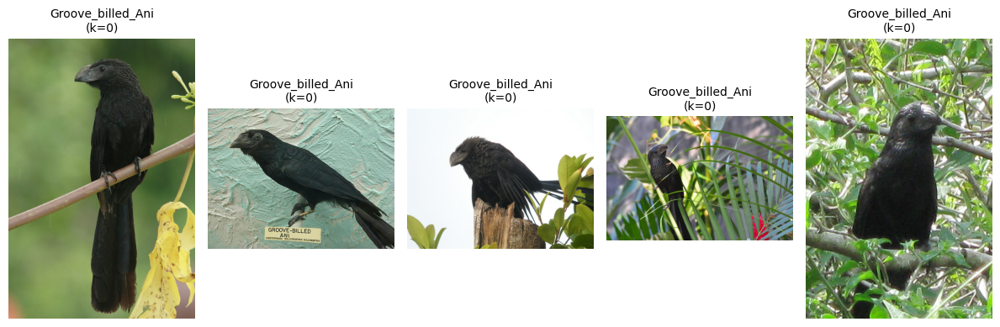

1: Red_winged_Blackbird  (showing 5 images)


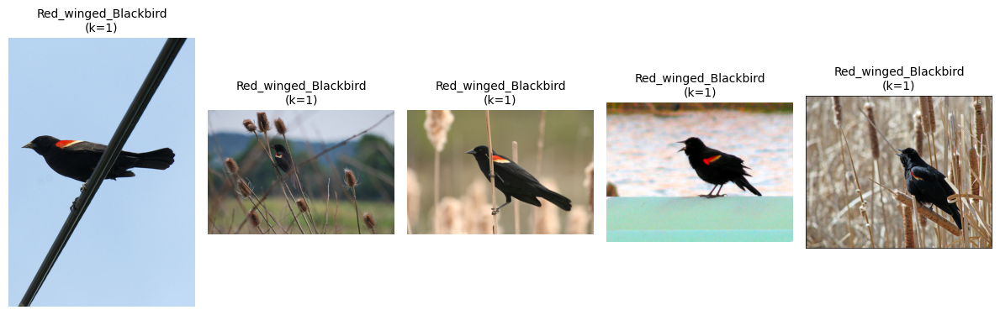

2: Rusty_Blackbird  (showing 5 images)


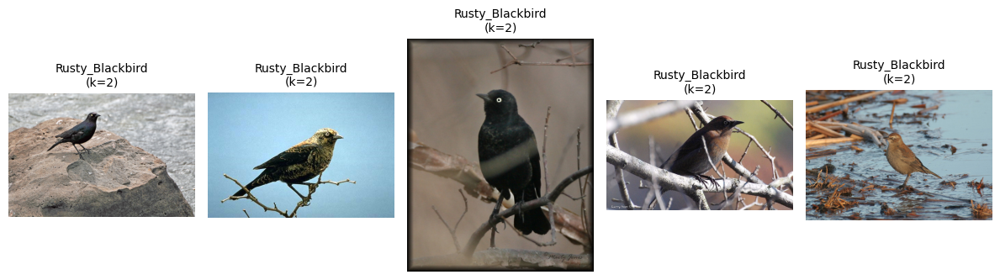

3: Gray_Catbird  (showing 5 images)


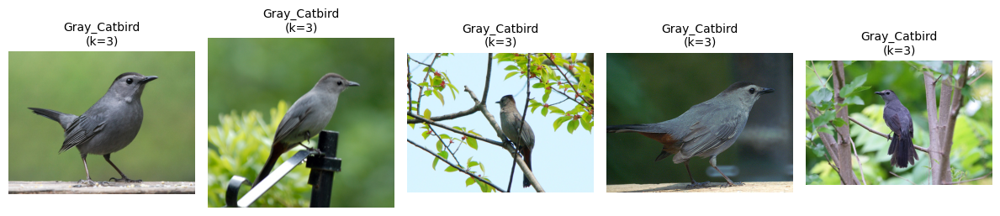

4: Brandt_Cormorant  (showing 5 images)


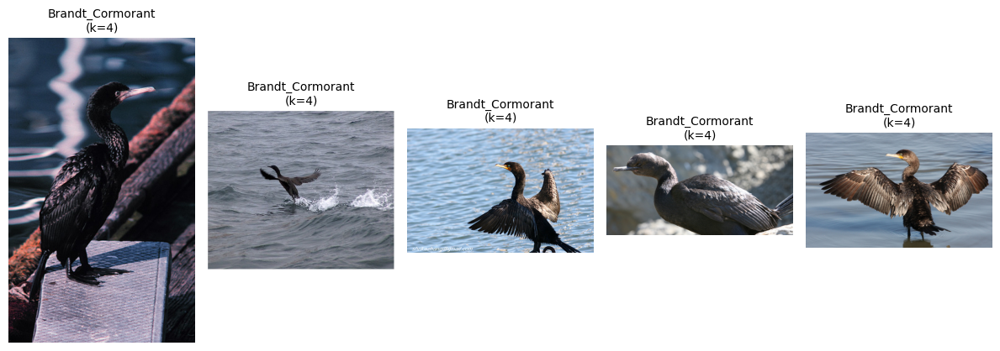

5: Eastern_Towhee  (showing 5 images)


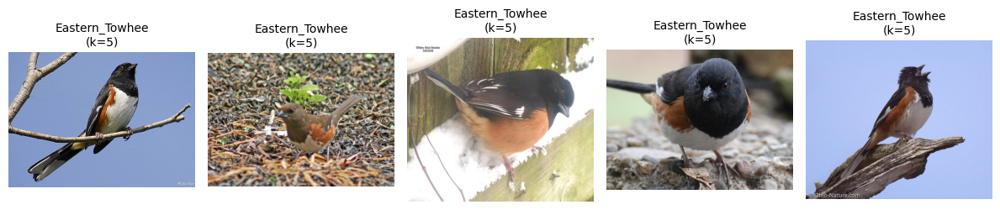

6: Indigo_Bunting  (showing 5 images)


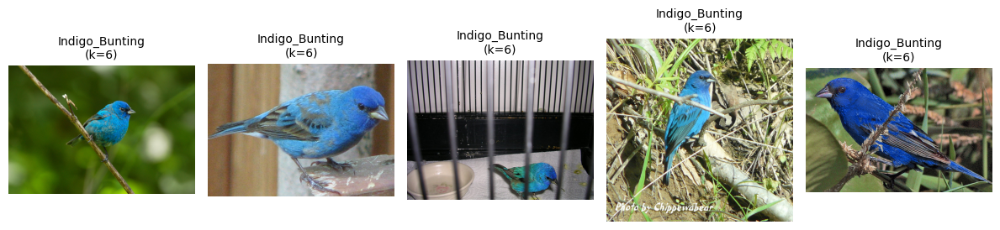

7: Brewer_Blackbird  (showing 5 images)


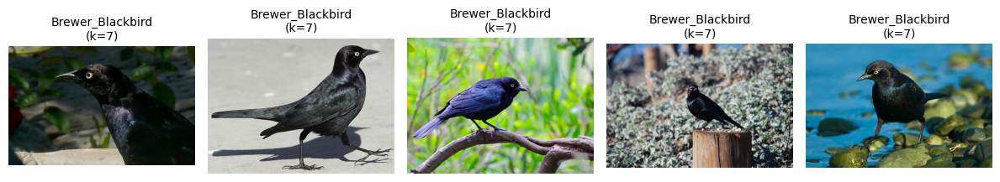

8: Painted_Bunting  (showing 5 images)


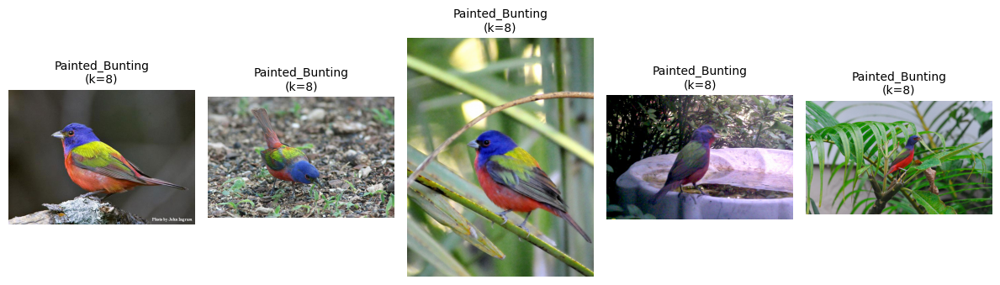

9: Bobolink  (showing 5 images)


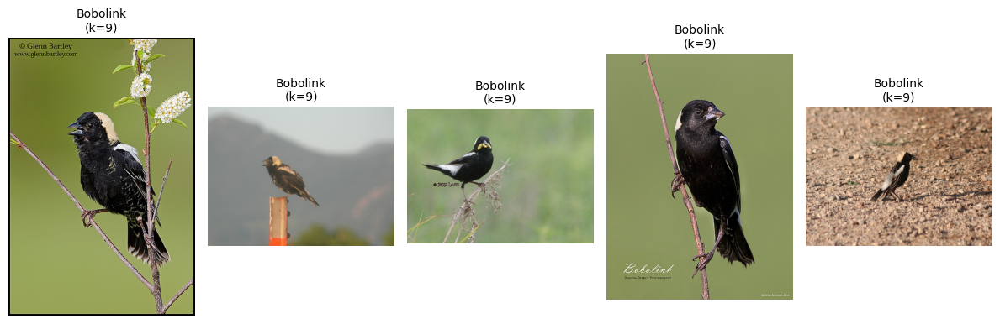

10: Lazuli_Bunting  (showing 5 images)


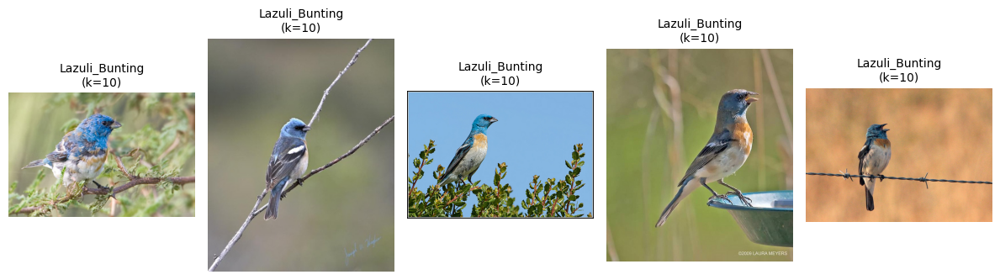

11: Yellow_headed_Blackbird  (showing 5 images)


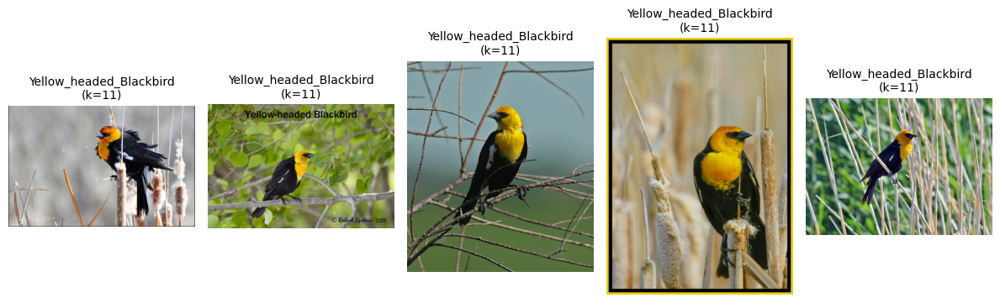

12: American_Crow  (showing 5 images)


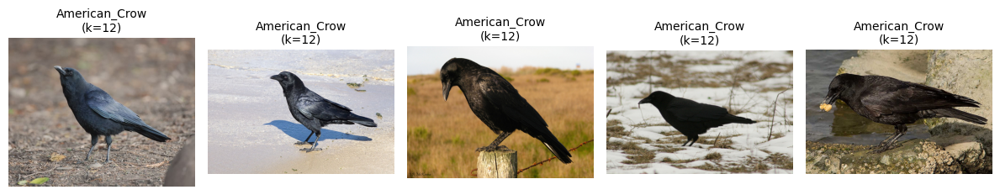

13: Fish_Crow  (showing 5 images)


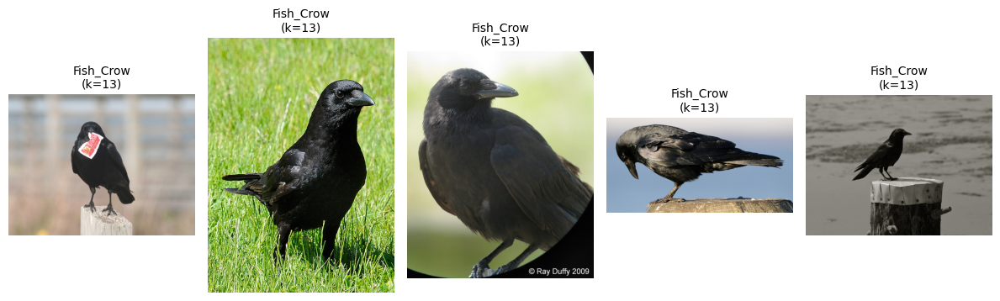

14: Brown_Creeper  (showing 5 images)


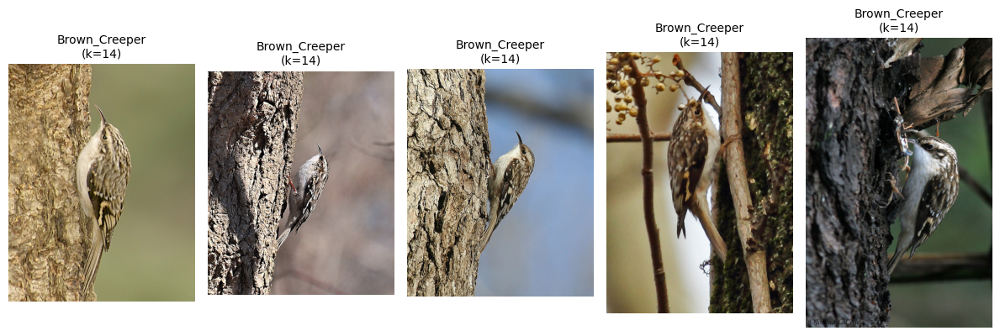

15: Yellow_billed_Cuckoo  (showing 5 images)


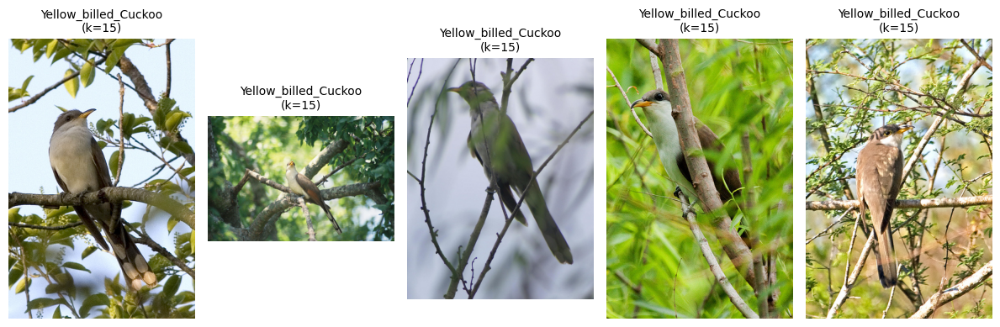

16: Yellow_breasted_Chat  (showing 5 images)


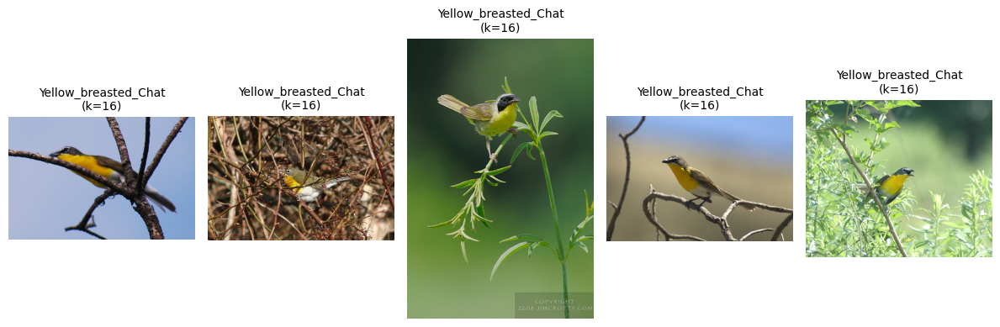

17: Black_billed_Cuckoo  (showing 5 images)


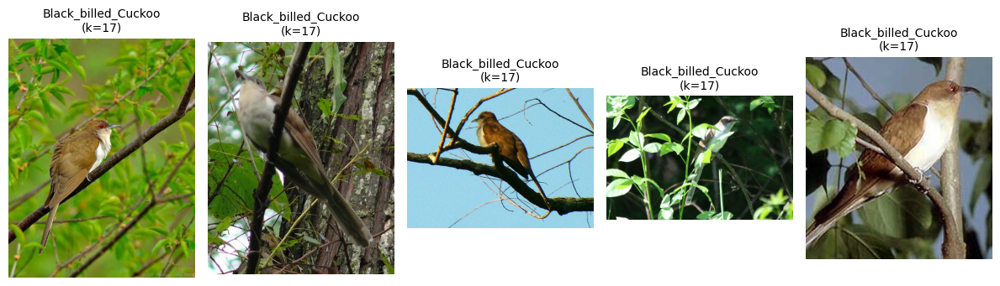

18: Gray_crowned_Rosy_Finch  (showing 5 images)


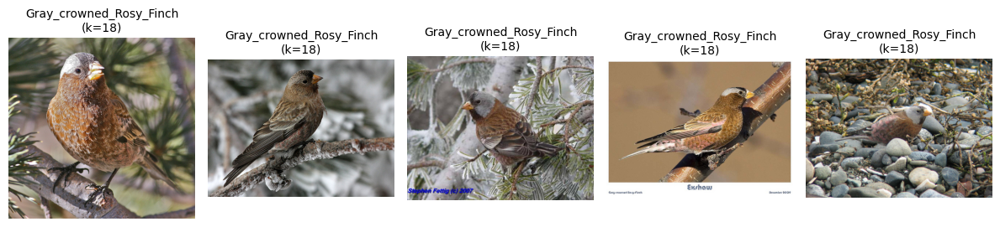

19: Bronzed_Cowbird  (showing 5 images)


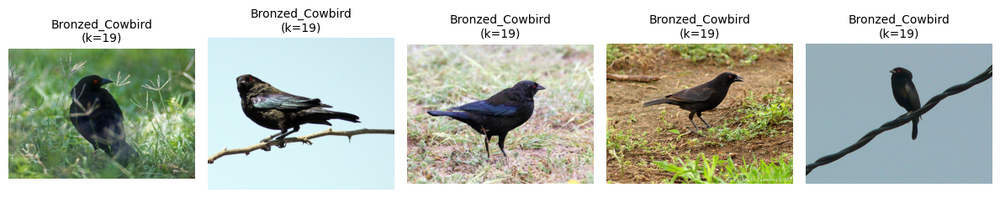

In [26]:
idx_to_name = {
  0: "Groove_billed_Ani",
  1: "Red_winged_Blackbird",
  2: "Rusty_Blackbird",
  3: "Gray_Catbird",
  4: "Brandt_Cormorant",
  5: "Eastern_Towhee",
  6: "Indigo_Bunting",
  7: "Brewer_Blackbird",
  8: "Painted_Bunting",
  9: "Bobolink",
  10: "Lazuli_Bunting",
  11: "Yellow_headed_Blackbird",
  12: "American_Crow",
  13: "Fish_Crow",
  14: "Brown_Creeper",
  15: "Yellow_billed_Cuckoo",
  16: "Yellow_breasted_Chat",
  17: "Black_billed_Cuckoo",
  18: "Gray_crowned_Rosy_Finch",
  19: "Bronzed_Cowbird",
}

def show_class(k, n=5):
    rows = train_df[train_df[LAB_COL] == k]
    picks = rows.sample(min(n, len(rows)), random_state=0)

    name = idx_to_name.get(int(k), f"class {k}")
    print(f"{k}: {name}  (showing {len(picks)} images)")

    fig = plt.figure(figsize=(12, 6))
    for i, (_, r) in enumerate(picks.iterrows()):
        p = DATA/"train_images"/str(r[IMG_COL])
        ax = plt.subplot(1, len(picks), i+1)
        ax.imshow(Image.open(p).convert("RGB"))
        ax.set_title(f"{name}\n(k={k})", fontsize=10)
        ax.axis("off")
    plt.tight_layout()
    plt.show()

for k in range(20):
    show_class(k, n=5)